<a href="https://colab.research.google.com/github/StephenKiiyuruNganga/dog-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶End to end multiclass dog breed classification

This notebook builds an end to end multiclass image classifier using Tensorflow 2.0 and Tensorflow Hub

## 1. Problem

Identifying the breed of a dog given an image of a dog

## 2. Data

The data is from Kaggle: https://www.kaggle.com/c/dog-breed-identification

## 3. Evaluation

A file listing the prediction probabilities for each dog breed of each test image

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Information about the data:
* We're dealing with images (unstructured data) so it's best if we use deep/transfer learning
* There are 120 breeds of dogs (i.e. 120 different classes)
* There are 10,000+ images in the training and test sets
* The training set has labels

In [ ]:
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# Get our workspace ready

* Import Tensorflow 2.X ✅
* Import Tensorflow Hub ✅
* Make sure we're using a GPU ✅

In [1]:
import tensorflow as tf
import tensorflow_hub as hub

print(f"TF version: {tf.__version__}")
print(f"TF Hub version: {hub.__version__}")

# Check for GPU availablility
print("GPU available 🥳" if tf.config.list_physical_devices("GPU") else "GPU not available 😭")

TF version: 2.11.0
TF Hub version: 0.12.0
GPU available 🥳


# Get our data ready



In [2]:
# checkout the labels for our train set

import pandas as pd

labels_df = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
labels_df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


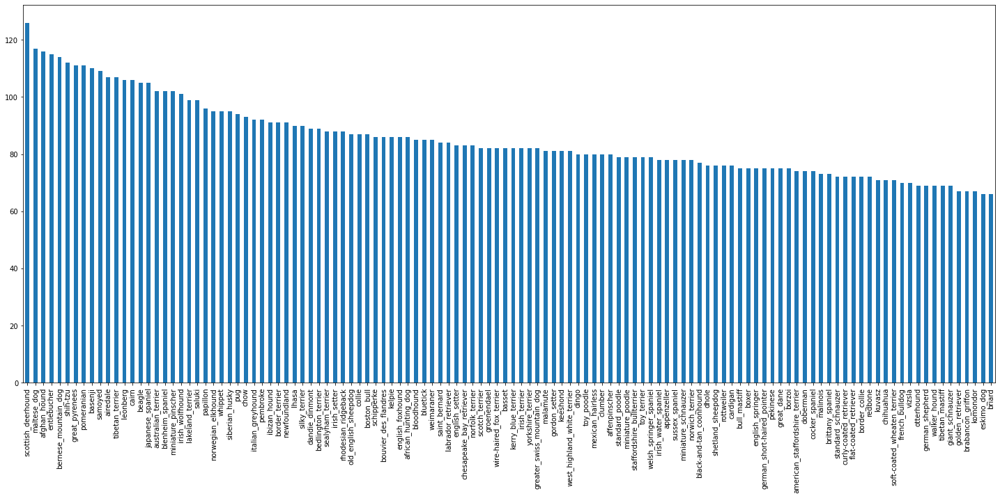

In [ ]:
# How many images are there for each breed?

labels_df["breed"].value_counts().plot.bar(figsize=(25, 10))

Google recommends having 100 images per class or at least 10 images per class for a start

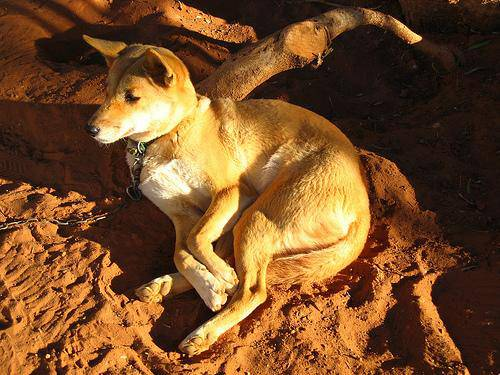

In [ ]:
# Let's view some of the images

from IPython.display import Image

Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [3]:
# Let's create a list of filepaths for each image
image_paths = [f"drive/My Drive/Dog Vision/train/{id}.jpg" for id in labels_df["id"]]
image_paths[:5]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# check whether number of paths == number of images in train set
import os

len(os.listdir("drive/My Drive/Dog Vision/train")) == len(image_paths)

True

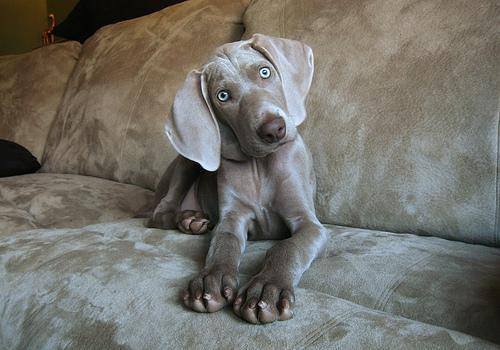

In [ ]:
# check if our paths work
Image(image_paths[7777])

In [4]:
# Let's turn our labels into a np array
import numpy as np

labels = np.array(labels_df["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels) == len(image_paths)

True

In [5]:
# Find the unique breed values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans

labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [6]:
# create a list of the boolean representation of each label vs the unique_breeds list

bool_labels = [label == unique_breeds for label in labels]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(bool_labels)

10222

## Create a validation set

In [7]:
# Lets set our X and y
X = image_paths
y = bool_labels

We are going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

## Turning our images into Tensors (numerical values/numpy arrays)

We can create a fn that preprocesses images using the following steps
1. Take an `image_path` as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) to a Tensor
4. Normalize our image - convert color channel values of range 0-255 to range 0-1
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Resources: 
1. https://www.tensorflow.org/guide/data
2. https://www.tensorflow.org/tutorials/load_data/images 

In [ ]:
# Converting an image to a NumPy array

from matplotlib.pyplot import imread

image = imread(image_paths[7777]) 
image.shape

(350, 500, 3)

*   As you can see, the `imread` returns the image as a **numpy array**
*   Our image is in the RGB format (Read more here: https://en.wikipedia.org/wiki/Channel_(digital_image))




In [ ]:
image[:2]

array([[[ 65,  46,  16],
        [ 65,  46,  16],
        [ 65,  46,  16],
        ...,
        [107,  97,  87],
        [104,  94,  84],
        [113, 103,  93]],

       [[ 64,  44,  17],
        [ 65,  46,  16],
        [ 65,  46,  16],
        ...,
        [108,  98,  88],
        [107,  97,  87],
        [112, 102,  92]]], dtype=uint8)

In [ ]:
# Lets convert the image to a tensor

tensor = tf.convert_to_tensor(image)
tensor[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 65,  46,  16],
        [ 65,  46,  16],
        [ 65,  46,  16],
        ...,
        [107,  97,  87],
        [104,  94,  84],
        [113, 103,  93]],

       [[ 64,  44,  17],
        [ 65,  46,  16],
        [ 65,  46,  16],
        ...,
        [108,  98,  88],
        [107,  97,  87],
        [112, 102,  92]]], dtype=uint8)>

In [8]:
# Define image size (determined by the type of model you choose to use)
IMG_SIZE = 224

def process_img(path, img_size=IMG_SIZE):
  """
  Read an image path and return a tensor

  This function reads an image path, converts the data to a tensor, normalizes it and resizes the image to the specified size.

  Parameters
  ----------
  path : str
      File path to the image.
  img_size : int, default IMG_SIZE
      Square dimensions the image should be resized to. Normally determined by the pre-trained model specifications.

  Returns
  -------
  img : tf.Tensor
      Converted image.
  """
  # Read/load in an image file
  image = tf.io.read_file(path)
  # Turn jpeg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from range 0-255 to range 0-1 (Normalize)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image to (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

Tit-bit: When googling some info on ML, type **Jeremy Howard** .... or **Yann Lecun** ...

## Turning our data into batches

Let's say we are trying to process 10,000+ images in one go... they all might not fit in memory

So that's why we do about **32 (batch size)** images at a time.

In order to use TensorFlow effeciently, we need our data in the form of Tensor tuples which look like this:
`(image, label)`



In [9]:
# Create a fn that returns a tuple (image, label)
def get_image_label(path, label):
  """
  Return a tuple of tensor and label

  This function calls the `process_img` function to convert a given path to a tensor and returns a tuple of the tensor and given label

  Parameters
  ----------
  path : str
      File path to an image.
  label : ndarray
      Boolean representation of a class

  Returns
  -------
  tuple
    Tensor and label
  """
  tensor_image = process_img(path)
  return (tensor_image, label)

In [ ]:
# Quick example of a tensor tuple. Both are tensors
(process_img(X[7777]), tf.constant(y[7777]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.24487375, 0.17820707, 0.06056001],
         [0.24689142, 0.18022475, 0.06257769],
         [0.2512069 , 0.18846181, 0.0587349 ],
         ...,
         [0.41832325, 0.38302913, 0.32420558],
         [0.45015615, 0.41094047, 0.36388165],
         [0.41976693, 0.38055122, 0.3334924 ]],
 
        [[0.23982845, 0.17316177, 0.05551471],
         [0.24315478, 0.1764881 , 0.05884104],
         [0.24767159, 0.18492648, 0.05546547],
         ...,
         [0.4333028 , 0.39800867, 0.33918512],
         [0.4119848 , 0.37276912, 0.3257103 ],
         [0.43455222, 0.39533654, 0.3482777 ]],
 
        [[0.23210786, 0.16544119, 0.0509804 ],
         [0.235676  , 0.16900933, 0.0518459 ],
         [0.23780967, 0.17359945, 0.04858303],
         ...,
         [0.43195358, 0.39665946, 0.3378359 ],
         [0.41838613, 0.37917042, 0.3321116 ],
         [0.47267124, 0.43345556, 0.38639674]],
 
        ...,
 
        [[0.4134815 , 0.47071192

In [10]:
# Let's create a fn to turn our data into batches
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Generates data batches.

  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles training data. Does not shuffle validation data
  Accepts test data as input (no labels).

  Parameters
  ----------
  X : ndarray
      Input data for a model.
  y : ndarray, default None
      Truth labels for the given input.
  batch_size : int, default BATCH_SIZE
      Number of consecutive elements of a dataset to combine in a single batch.
  valid_data : bool, default False
      Determines whether or not X is a validation dataset.
  test_data : bool, default False
      Determines whether or not X is a test dataset.
  
  Returns
  -------
  data_batches : BatchDataset
      Data batches.
  """
  if test_data:
    print("Creating test data batches...\n")
    # convert X (our image_paths list) into tensors
    X_tensors = tf.constant(X)
    # turn X_tensors into a Dataset
    data_set = tf.data.Dataset.from_tensor_slices(X_tensors)
    # since we don't have labels, we only process images 
    data_set_processed = data_set.map(process_img)
    # turn the processed data_set into batches
    data_batches = data_set_processed.batch(BATCH_SIZE) 
    return data_batches

  elif valid_data:
    print("Creating validation data batches...\n")
    # convert X (our image_paths list) and y (our dog breed labels) into tensors
    X_tensor = tf.constant(X)
    y_tensor = tf.constant(y)
    # create a Dataset from a tensor tuple of X and y
    data_set = tf.data.Dataset.from_tensor_slices((X_tensor, y_tensor))
    # since we have labels, we use get_image_label to process the image and retrun a tuple of image, label
    data_set_processed = data_set.map(get_image_label)
    # turn processed data_set into batches
    data_batches = data_set_processed.batch(BATCH_SIZE) 
    return data_batches
  
  else:
    print("Creating training data batches...\n")
    # convert X (our image_paths list) and y (our dog breed labels) into tensors
    X_tensor = tf.constant(X)
    y_tensor = tf.constant(y)
    # create a Dataset from a tensor tuple of X and y
    data_set = tf.data.Dataset.from_tensor_slices((X_tensor, y_tensor))
    # Shuffle the Dataset (it is faster to shuffle paths+labels than images. Hence we will shuffle before image processing)
    data_set_shuffled = data_set.shuffle(buffer_size=len(X))
    # since we have labels, we process the image and retrun a tuple of image, label
    data_set_processed = data_set_shuffled.map(get_image_label)
    # turn processed data_set into batches
    data_batches = data_set_processed.batch(BATCH_SIZE) 
    return data_batches


See example of how `batch()` works: https://www.tensorflow.org/api_docs/python/tf/data/Dataset#batch

In [ ]:
# Let's create our data batches

train_batches = create_data_batches(X_train, y_train)
validation_batches = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...

Creating validation data batches...



In [ ]:
train_batches.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
validation_batches.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

We are able to create batches but we can't really see how the data looks like. We only get a description using `element_spec` which isn't so useful.

So let's create a fn that will help us visualize our batches much better

In [11]:
import matplotlib.pyplot as plt

def show_images(images, labels, num=25, figsize=20):
  """
  Generate a plot.

  Render image label pairs as a matoplotlib plot.

  Parameters
  ----------
  images : ndarray
    List of converted images.
  labels : ndarray
    List of boolean lables.
  num : int, default 25
    Number of images to plot.
  figsize : int, default 20
    Size of the matplotlib figure.
  """
  # Setup the figure
  plt.figure(figsize=(figsize, figsize))
  # Loop through the num
  for n in range(num):
    # create subbplots (a square preferably)
    ax = plt.subplot(np.sqrt(num), np.sqrt(num), n+1)
    # display an image
    plt.imshow(images[n])
    # add the label as image title
    plt.title(unique_breeds[labels[n].argmax()])
    # turn off the grid lines
    plt.axis("off")

In [ ]:
# get the first batch from train_batches

train_images, train_labels = next(train_batches.as_numpy_iterator())

In [ ]:
train_images[0]

In [ ]:
train_labels[0]

In [ ]:
len(train_images), len(train_labels)

(32, 32)

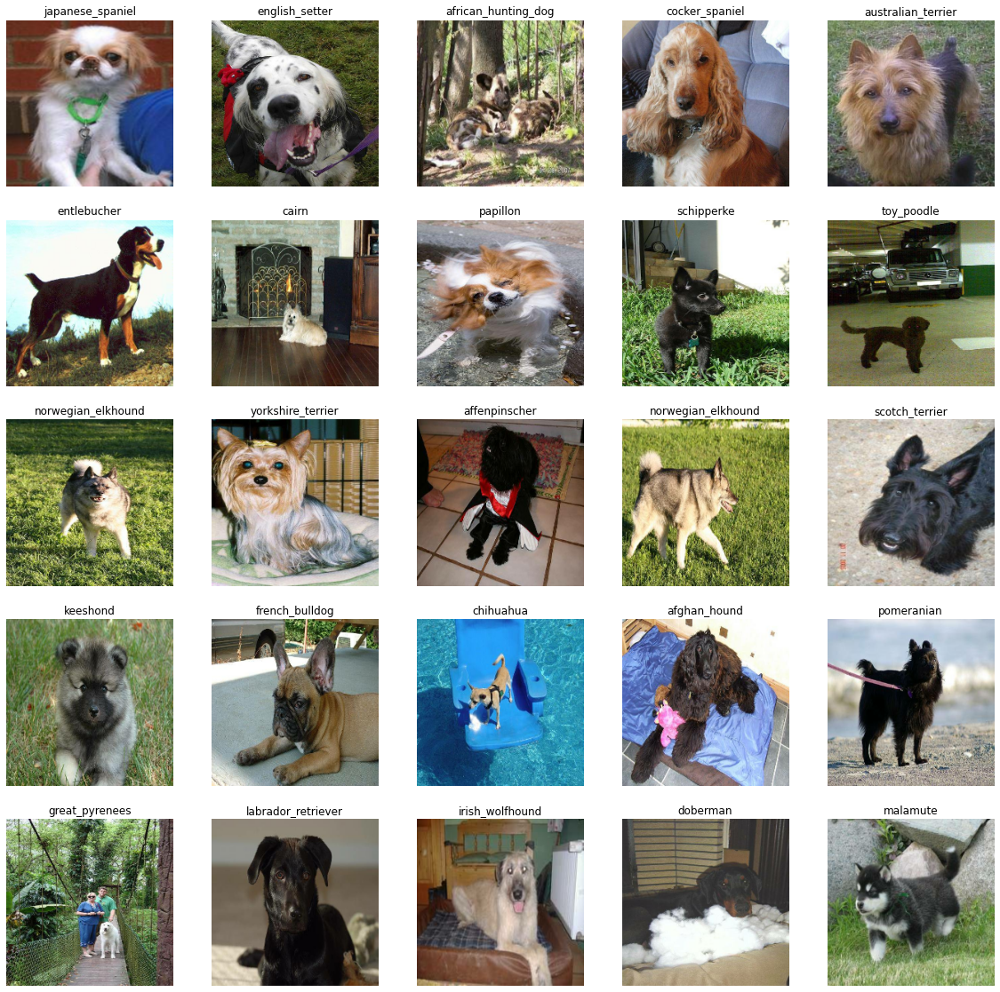

In [ ]:
# now lets use our visualization fn to view 25 images from our first batch

show_images(train_images, train_labels)

# Building a model 🤖

Image classification models have millions of parameters. Training them from scratch requires a lot of labeled training data and a lot of computing power. Transfer learning is a technique that shortcuts much of this by taking a piece of a model that has already been trained on a related task and reusing it in a new model. Read more here: https://www.tensorflow.org/hub/tutorials/tf2_image_retraining

Before we build a model, we need to define:
1. Input shape (our images shape, in the form of Tensors) 
2. Output shape (image labels, in the form of Tensors)
3. URL of the model we want to use: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

What ChatGPT said: (https://chat.openai.com/chat/1e7be3ea-df4e-41b4-87a7-4c4a8b5f9104)
> In the context of computer vision, some examples of general features that are often learned by the early layers of a convolutional neural network (CNN) include: 
 * Edges: Simple edges and their orientation (vertical, horizontal, diagonal, etc.).
 * Corners: Corners and junctions of edges.
 * Textures: Repeating patterns in an image, such as the texture of fur or fabric.
 * Blobs: Blobs of color or texture that can represent simple shapes or parts of objects.
 
> These general features form the building blocks for higher-level features that can be learned by later layers in the network. For example, combinations of edges and corners can be used to represent simple shapes such as circles or squares. Higher-level features such as object parts, objects, and scenes can then be represented by combinations of these lower-level features.

> It's important to note that these general features are not specific to any particular task, which is why they can be useful for many tasks. For example, the same edge detection filters can be useful for recognizing objects in natural images, detecting edges in medical images, and more.

In [ ]:
train_batches.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [13]:
# batch, height, width, colour_channels
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

* Let's put togethor the above in a Keras deep learning model
* What is Keras? A neural network library that runs on top of TensorFlow.

We will create a fn that:
1. Takes the input shape, output shape and chosen model as params
2. Define the layers in the Keras model in sequential fashion
3. Compiles the model (says it should be evaluated and improved)
4. Builds the model (tell's the model the input shape it'll be getting)
5. Returns the model

All these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model#transfer_learning_with_a_sequential_model

How CNNs work: https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

mobile_v2 architecture: https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c

Some tips:
* Binary classification:
  * Loss: `BinaryCrossentropy`
  * Activation: `sigmoid`
* Multi-class classification
  * Loss: `CategoricalCrossentropy`
  * Activation: `softmax` 

What is softmax: https://en.wikipedia.org/wiki/Softmax_function

> after applying softmax, each component will be in the interval (0,1), and the components will add up to 1, so that they can be interpreted as probabilities



In [14]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Generates and returns a model.

  Create an instance of a model using a specified URL, compile, build and return it.

  Parameters
  ----------
  input_shape : list, default INPUT_SHAPE
    List of specifications for the input data such as batch, height, width, colour_channels.
  output_shape : int, default OUTPUT_SHAPE
    Total number of classes.
  model_URL : str, default MODEL_URL
    URL of the pre-trained model.

  Returns
  -------
  model : keras.engine.sequential.Sequential
    Generated model
  """
  print(f"Building model with: {MODEL_URL}")

  # create model instance (specify the layers)
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")]) # Layer 2 (output layer) 
  
  # compile the the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), # a loss fn to find out for how well your model is guessing while learning the patterns
                optimizer=tf.keras.optimizers.Adam(), # an optimizer fn to help your model improve its guesses
                metrics=["accuracy"]) # a way of evaluating the guesses once learning is complete
  
  # build model
  model.build(INPUT_SHAPE)

  return model

In [16]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#### Visualizing our model

We can view a graphical representation of our model using some cool keras utilities

We will use `plot_model` from `tf.keras.utils`

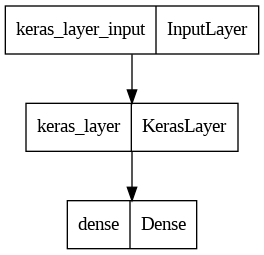

In [18]:
tf.keras.utils.plot_model(model, "my first CNN.png")

### Creating callbacks

Callbacks are helper functions that a model can use to:
1. check it's training progress
2. save it's training progress
3. stop training early if there is no more improvement

We will create 2 callbacks i.e.:
* TensorBoard callback: to help track our model's progress
* Early stopping callback: to prevent our model from training for too long and probably start overfitting (model gives accurate predictions for training data but not for new data)

#### TensorBoard Callback

We need to do 3 things:
1. Load the TensorBoard notebook extention
2. Create a TensorBoard callback that is able to save logs to a directory/folder and pass it to our model's `fit()` fn.
3. Visualize our model's training logs with the `%tensorboard` magic fn (we will do this after training)

In [31]:
# Load TensorBoard into our notebook
%load_ext tensorboard

In [19]:
import datetime

# Create a fn to build  a TensorBoard callback
def create_tensorboard_callback():
  """
  Generate amd return a Tensorboard callback

  Create a TensorBoard callback using a given log directory

  Returns
  -------
  TensorBoard() : class
    TensorBoard instance
  """
  # create a path to the folder where the logs will be stored
  log_dir = os.path.join("drive/My Drive/Dog Vision/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  # return the callback that will log and save events for TensorBoard using the given path
  return tf.keras.callbacks.TensorBoard(log_dir)

#### Early Stopping Callback

It helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [20]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                  patience=3) # number of epochs to wait (after it detects no further improvement) before stopping

## Training a model (on a subset of data)

We will train on 1000 images first in order to ensure all our code so far is working correctly.

**EPOCH**: how many passes of the data we would like our model to do. You can think of a pass as each time our model looks at an image and tries to identify which patterns associate with which label

In [21]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Lets create a fn to train our model using the following these steps:

1. instantiate a model using `create_model()`
2. instantiate a TensorBoard callback using `create_tensorboard_callback`
3. train model using `fit()` passing it training and validation data, number of epochs and the callbacks we would like to use
4. return the model

In [ ]:
def train_model():
  """
  Train and return a model

  Create model instance using `create_model`, create an TensorBoard instance using `create_tensorboard_callback` and train the model using the given data batches

  Returns
  -------
  model: keras.engine.sequential.Sequential
    Trained model
  """
  model = create_model()

  tensorboard = create_tensorboard_callback() # a new tensorboard session and log_dir (folder) will be created for each training session

  model.fit(x=train_batches,
            epochs=NUM_EPOCHS,
            validation_data=validation_batches,
            validation_freq=1, # how often the model should test the patterns its found on the validation set (per epoch)
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 199s 8s/step - loss: 4.5962 - accuracy: 0.1063 - val_loss: 3.5978 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 3s 127ms/step - loss: 1.6239 - accuracy: 0.6850 - val_loss: 2.2740 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 4s 160ms/step - loss: 0.5479 - accuracy: 0.9400 - val_loss: 1.8011 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 3s 120ms/step - loss: 0.2470 - accuracy: 0.9900 - val_loss: 1.6129 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 3s 121ms/step - loss: 0.1465 - accuracy: 0.9937 - val_loss: 1.5472 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 3s 119ms/step - loss: 0.0990 - accuracy: 0.9975 - val_loss: 1.5006 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================]

Notice that our epochs stopped at 10. This is because the accuracy on our training data has stopped increasing. Remember the early_stopping callback...

Also the accuracy on the training data is significantly higer than that of the validation data. Thus our model is overfitting

Overfitting that occurs during the 1st training session is **good** because its an indication that our model is learning

Now let's figure out how to prevent overfitting in the next training sessions.

## Checking the TensorBoard

Lets use the `%tensorboard` magic fn to access the logs we created during training

In [32]:
%tensorboard --logdir="drive/My Drive/Dog Vision/logs" 

<IPython.core.display.Javascript object>

# Make predictions

In [ ]:
predictions =  model.predict(validation_batches, verbose=1)

7/7 [==============================] - 2s 89ms/step


In [ ]:
predictions.shape

(200, 120)

Remember our validation images were 200 in total, therefore we get 200 predictions in the form of an array made of 120 elements.

In [ ]:
# lets see how the first prediction looks like

predictions[0]

array([3.4280000e-03, 3.1216160e-04, 6.0629868e-04, 1.3228100e-04,
       1.8022904e-04, 3.9280752e-05, 6.2790508e-03, 2.5745281e-03,
       1.3370271e-04, 1.1609531e-03, 2.4321281e-04, 1.7983859e-04,
       9.4426412e-04, 9.2261456e-05, 2.4832675e-04, 2.9022872e-04,
       5.3194017e-05, 1.3553664e-01, 8.2140199e-05, 9.4232368e-05,
       2.9440795e-04, 7.0385047e-04, 4.0337520e-05, 2.3432740e-03,
       3.5825578e-05, 2.5395022e-04, 5.2575201e-02, 9.7561897e-05,
       2.2768605e-05, 3.5505890e-04, 2.2558050e-05, 1.0022918e-03,
       2.5134155e-04, 1.5694494e-04, 1.2815150e-04, 2.6181033e-02,
       1.9313517e-05, 1.6757718e-04, 1.2870823e-04, 7.1440321e-05,
       2.3281281e-03, 1.1822115e-04, 1.8758529e-04, 2.0554525e-04,
       1.8074688e-04, 4.9003033e-04, 4.1208492e-05, 2.1577833e-04,
       8.3654089e-04, 5.4855416e-05, 6.2702707e-04, 1.8760721e-04,
       4.5504526e-04, 2.6282232e-04, 2.0782699e-04, 1.6872303e-04,
       6.0398993e-04, 1.7607913e-03, 1.6987389e-04, 2.0820307e

* Looking at one of these predictions, we can see that it contains some numbers. These numbers represent the probability of a label being the correct one. The probabilities are also known as confidence intervals

* Remember we used `softmax` activation for our output layer

* From wikipedia...
> but after applying softmax, each element will be in the interval 
(0,1), and the element will add up to 1

* Remember our labels were initially in the form of boolean labels. Therefore if we get the index of the highest probability, we can find out the breed using
`unique_labels[idx]`

In [ ]:
predicted_label = unique_breeds[np.argmax(predictions[0])]  
predicted_label

'komondor'

In [22]:
# Let's creat a fn that will do the above

def get_label(prediction):
  """
  Converts a prediction to a class name

  Parameters
  ----------
  prediction : ndarray
    List of prediction probabilities

  Returns
  -------
  str
    Class name
  """
  return unique_breeds[np.argmax(prediction)]

In [ ]:
get_label(predictions[0])

'komondor'

Since our validation data is in the form of batches,  we will have to `unbatch` it so that we can compare our predicted labels to the validation labels (truth labels)

In [23]:
def get_data_from_batch(batch):
  """
  Retrieves data from a batch

  Parameters
  ----------
  batch : BatchDataset
    Set of batches

  Returns
  -------
  tuple
    Retrieved data
  """
  retrieved_images = []
  retrieved_labels = []
  
  for image, label in batch.unbatch().as_numpy_iterator():
    retrieved_images.append(image)
    retrieved_labels.append(label)

  return retrieved_images, retrieved_labels

In [ ]:
val_images, val_labels = get_data_from_batch(validation_batches)
get_label(val_labels[0])

'cairn'

Lets now create a fn that visualizes the predictions vs the truth. So our fn will:
1. Take predictions, truth labels, images and index
2. Convert prediction and truth to breed name
3. Plot the image, prediction and truth

In [24]:
def plot_prediction(predictions, truths, images, idx=0):
  """
  Generate a matplotlib plot

  Create a plot of a predicted class and the associated image

  Parameters
  ----------
  predictions : ndarray
    List of predictions
  truths : ndarray
    List of boolean class labels
  images : ndarray
    List of converted images
  idx : int, default 0
    Index of the desired prediction from the predictions list
  """
  predicted_label = get_label(predictions[idx])
  confidence = np.max(predictions[idx]) * 100
  true_label = get_label(truths[idx])
  img = images[idx]

  colour = "green" if  predicted_label == true_label else "red"

  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.xlabel(f"{predicted_label} ({confidence:.0f}%)", color=colour)
  plt.title(true_label)


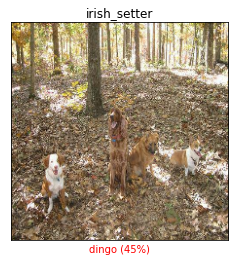

In [ ]:
plot_prediction(predictions=predictions,
                truths=val_labels,
                images=val_images,
                idx=81)

Lets now create a fn that displays the top 10 labels that the model predicted for a given image. 

In [25]:
def plot_top_10(predictions, truths, idx=0):
  """
  Generate a matplotlib plot

  Create a bar plot of the top 10 predicted classes from a given prediction

  Parameters
  ----------
  predictions : ndarray
    List of predictions
  truths : ndarray
    List of boolean class labels
  idx : int, default 0
    Index of the desired prediction from the predictions list
  """
  true_label = get_label(truths[idx])
  top_10_idx = predictions[idx].argsort()[::-1][:10]
  top_10_probabilities = predictions[idx][top_10_idx]
  top_10_pred_labels = unique_breeds[top_10_idx]

  fig = plt.bar(np.arange(len(top_10_pred_labels)),
                top_10_probabilities,
                color="gray")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  if np.isin(true_label, top_10_pred_labels):
    fig[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

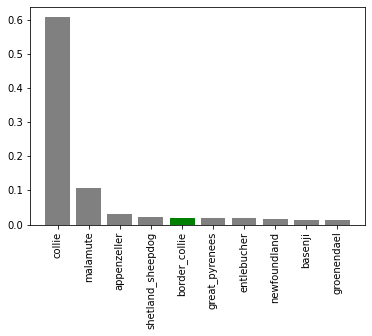

In [ ]:
plot_top_10(predictions=predictions,
            truths=val_labels,
            idx=9)

Now we've got a way to plot the top 10 labels (`plot_top_10`) of a single prediction and also a way to plot the image + predicted label + true label (`plot_prediction`)

Lets combine the 2 into one plot

In [26]:
def plot_predictions_data(i_multiplier=0, num_rows=3, num_cols=2):
  """
  Generate a matplotlip plot

  Combine a `plot_top_10` plot with `plot_prediction` plot into one figure

  Parameters
  ----------
  i_multiplier : int, default 0
    Not sure how to explain this
  num_rows : int, default 3
    Number of rows in the figure
  num_cols : int, default 2
    Number of columns in the figure
  """
  num_images = num_rows * num_cols
  plt.figure(figsize=(10*num_cols, 5*num_rows))

  for i in range(num_images):
    # image section
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_prediction(predictions=predictions,
                      truths=val_labels,
                      images=val_images,
                      idx=i+i_multiplier)
    
    # bar section
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_top_10(predictions=predictions,
                      truths=val_labels,
                      idx=i+i_multiplier)
  
  plt.tight_layout(h_pad=1.0)
  plt.show()

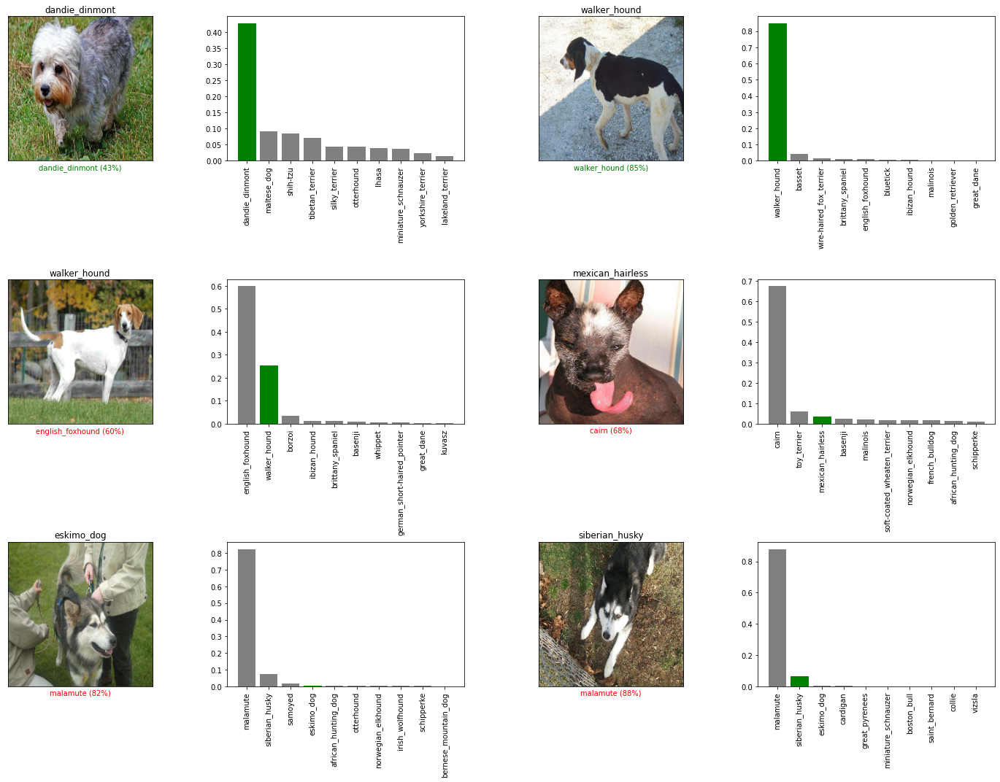

In [ ]:
plot_predictions_data(30)

## Challenge: Create a confusion matrix of the predictions vs true labels

Our `predictions` are in the form of **probability values** while our `val_labels` are in the form of **booleans**

Resource: 

https://towardsdatascience.com/exploring-confusion-matrix-evolution-on-tensorboard-e66b39f4ac12

https://medium.datadriveninvestor.com/building-a-confusion-matrix-from-scratch-85a8bfb97626

In [ ]:
indexed_predictions = [np.argmax(p) for p in predictions]
indexed_predictions[0]


65

In [ ]:
indexed_labels = [np.argmax(p) for p in val_labels]
indexed_labels[0]

26

In [ ]:
tf.math.confusion_matrix(
    indexed_predictions,
    indexed_labels,
    num_classes=len(unique_breeds),
)

<tf.Tensor: shape=(120, 120), dtype=int32, numpy=
array([[2, 0, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 2, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 2]], dtype=int32)>

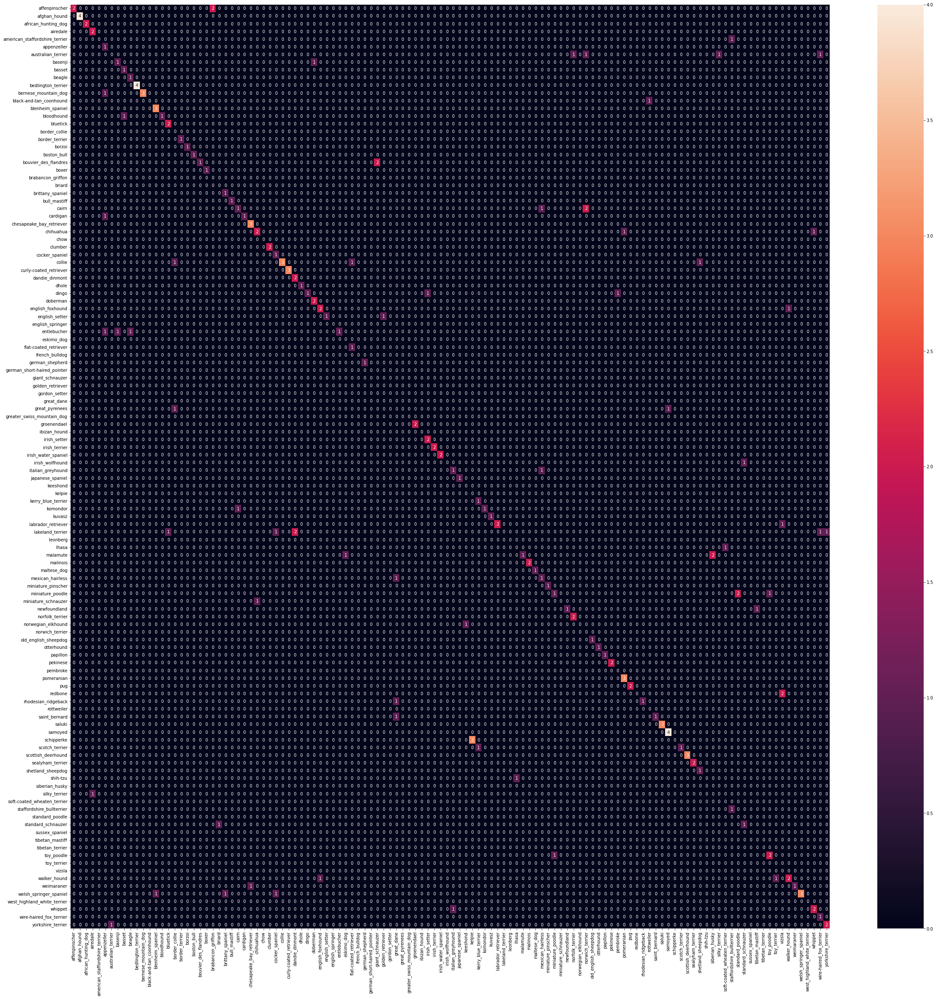

In [ ]:
import seaborn as sn
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=[get_label(pred) for pred in predictions],
                 y_pred=[get_label(label) for label in val_labels],
                 labels=list(unique_breeds))

df_cm = pd.DataFrame(cm, columns=unique_breeds, index=unique_breeds)
plt.figure(figsize = (40,40))
sn.heatmap(df_cm, annot=True)

plt.show()

# Saving and reloading a trained model

In [27]:
# save fn

def save_model(model, suffix=None):

  """
  Saves a model to a directory.

  Saves a given model to a 'models' directory and appends a suffix and returns the path.

  Parameters
  ----------
  model : tf.keras.Sequential()
    A trained model.
  suffix : str, default None
    Number of images used to train the model, optimizer, chosen pretrained model.

  Returns
  -------
  model_path : str
    URL of the saved model
  """

  model_dir = os.path.join("drive/My Drive/Dog Vision/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M"))
  model_path = f"{model_dir}-{suffix}.h5"
  print(f"Saving model to: {model_path} ...")
  model.save(model_path)
  return model_path

In [28]:
# load fn

def load_model(path):
  """
  Load a model

  Loads a saved model from a specified path

  Parameters
  ----------
  path : str
    URL of the saved model
  
  Returns
  -------
  model : tf.keras.Sequential()
    A saved model.
  """

  print(f"Loading saved model from: {path}")
  model = tf.keras.models.load_model(path,
                                     custom_objects={"KerasLayer": hub.KerasLayer}) # telling tensorflow that our model has a custom layer (our input layer which is a pretrained model - MobileNetV2)

  return model

In [ ]:
# Save our model trained on 1000 images and uses Adam optimizer

model_path = save_model(model, suffix="1000-images-MobileNetV2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20230208-0523-1000-images-MobileNetV2-Adam.h5 ...


In [ ]:
# Load a trained model

loaded_1000_image_model = load_model(model_path)

Loading saved model from: drive/My Drive/Dog Vision/models/20230208-0523-1000-images-MobileNetV2-Adam.h5


In [ ]:
# Evaluate the saved model on the validation data

loaded_1000_image_model.evaluate(validation_batches)

7/7 [==============================] - 2s 119ms/step - loss: 1.4085 - accuracy: 0.6400


[1.40854811668396, 0.6399999856948853]

# Training a big dog model 🐶 (full data)

In [ ]:
len(X), len(y) # this is what we need to use to train the big dog model

(10222, 10222)

In [ ]:
len(X_train) # this is what we used to train the current model

800

In [ ]:
X[0], y[0]

('drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
    

In [29]:
# Create data batches from X and y (our train set)

full_data = create_data_batches(X, y)
full_data

Creating training data batches...



<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# instantiate, compile and build a new model
full_model = create_model()
full_model

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# instantiate our helper fn for training (callbacks)

full_model_tensorboard = create_tensorboard_callback()
# no validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                  patience=3) # when the accuracy stops increasing for 3 epochs, we stop the training

**NOTE:** Running the cell below will take a while (maybe up to 30 min for the first epoch). Remember the GPU has to load all of the 10,000+ images into memory

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 107ms/step - loss: 1.3528 - accuracy: 0.6722
Epoch 2/100
320/320 [==============================] - 34s 105ms/step - loss: 0.3970 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2373 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1560 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 48s 151ms/step - loss: 0.1066 - accuracy: 0.9771
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0772 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0587 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 34s 108ms/step - loss: 0.0467 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0383 - accuracy: 0.9950
Epoch 10/100
320/320 [==============================] - 34s 107m

In [ ]:
full_model_path = save_model(full_model, suffix="10222-images-MobileNetV2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20230208-0625-10222-images-MobileNetV2-Adam.h5 ...


In [33]:
# lets test whether we can load it

loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20230208-0625-10222-images-MobileNetV2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20230208-0625-10222-images-MobileNetV2-Adam.h5


# Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into the same format

Luckily we created `create_data_batches()` earlier which can take a list of image_paths as input and convert them into tensor batches

To make predictions on the test data we'll:
* Get the test image paths
* Convert the filenames into batches
* Make predictions by passing the batches to `predict()`

In [34]:
# generate paths
import os

test_folder_path = "drive/MyDrive/Dog Vision/test"
test_image_paths =  [f"{test_folder_path}/{image_name}" for image_name in os.listdir(test_folder_path)]
len(test_image_paths), test_image_paths[0]

(10357, 'drive/MyDrive/Dog Vision/test/de9fc145601771b7a5b7e68822416fb5.jpg')

In [ ]:
# create batches
test_batches = create_data_batches(X=test_image_paths, test_data=True)
test_batches.element_spec

Creating test data batches...



TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)

**NOTE:** making predictions on 10000+ images will take a while

In [ ]:
# Make predictions on test data and save
test_preds = loaded_full_model.predict(test_batches, verbose=1)
np.savetxt("drive/MyDrive/Dog Vision/test/preds_array.csv", test_preds, delimiter=",")
len(test_preds), test_preds[0]

324/324 [==============================] - 3546s 11s/step


(10357, array([5.52943542e-13, 9.55715729e-10, 2.07730172e-14, 5.19839616e-10,
        1.24008559e-09, 9.11765099e-08, 6.00268057e-10, 2.33510704e-07,
        1.67193787e-06, 2.67661079e-07, 8.69129158e-10, 2.35769143e-15,
        1.34390882e-06, 3.89824867e-10, 1.26722898e-05, 7.16323484e-07,
        6.02403738e-10, 4.47611512e-07, 4.01359918e-11, 5.48144204e-11,
        7.07298759e-12, 4.64646916e-08, 1.73387562e-08, 9.12676185e-13,
        1.17726018e-09, 1.69988903e-06, 7.99724436e-12, 5.09695113e-08,
        3.00269981e-04, 1.12163397e-10, 1.20146808e-07, 7.20346394e-10,
        3.99253182e-08, 2.71655320e-09, 1.68925740e-09, 1.10659919e-11,
        2.15605382e-06, 5.47154341e-04, 3.65851932e-10, 2.82488713e-07,
        1.79599779e-09, 2.63220917e-10, 4.53163622e-08, 6.30894065e-05,
        7.21835391e-08, 5.76324988e-10, 3.55804855e-06, 1.56313149e-06,
        4.95869845e-10, 7.62285478e-03, 1.55804647e-09, 5.62465459e-07,
        1.59664797e-08, 1.86603266e-09, 4.80685700e-11, 5

In [ ]:
# load predictions
import numpy as np

test_preds = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", 
                        delimiter=",") # the string used to separate values

In [ ]:
test_preds[0]

array([5.52943542e-13, 9.55715729e-10, 2.07730172e-14, 5.19839616e-10,
       1.24008559e-09, 9.11765099e-08, 6.00268057e-10, 2.33510704e-07,
       1.67193787e-06, 2.67661079e-07, 8.69129158e-10, 2.35769143e-15,
       1.34390882e-06, 3.89824867e-10, 1.26722898e-05, 7.16323484e-07,
       6.02403738e-10, 4.47611512e-07, 4.01359918e-11, 5.48144204e-11,
       7.07298759e-12, 4.64646916e-08, 1.73387562e-08, 9.12676185e-13,
       1.17726018e-09, 1.69988903e-06, 7.99724436e-12, 5.09695113e-08,
       3.00269981e-04, 1.12163397e-10, 1.20146808e-07, 7.20346394e-10,
       3.99253182e-08, 2.71655320e-09, 1.68925740e-09, 1.10659919e-11,
       2.15605382e-06, 5.47154341e-04, 3.65851932e-10, 2.82488713e-07,
       1.79599779e-09, 2.63220917e-10, 4.53163622e-08, 6.30894065e-05,
       7.21835391e-08, 5.76324988e-10, 3.55804855e-06, 1.56313149e-06,
       4.95869845e-10, 7.62285478e-03, 1.55804647e-09, 5.62465459e-07,
       1.59664797e-08, 1.86603266e-09, 4.80685700e-11, 5.48659868e-11,
      

# Preparing our data for submission

Kaggle has specified that our data needs to be in the format of a csv with an ID and column for each breed (https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation)

So to get our data into that format we will need to:
1. Create a df with the spec columns
2. Extract ids from test image names and add them to ID col
3. Add predictions to df
4. Export to csv and submit

In [ ]:
# create df and add breed columns

import pandas as pd

df_preds = pd.DataFrame(columns=["id"] + list(unique_breeds))
df_preds

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Extract ids

import os

id_list = [name.split(".")[0] for name in  os.listdir("drive/MyDrive/Dog Vision/test")]
id_list[:5], len(id_list)

(['e5c0666aa15120eba4718ae947a52c45',
  'df01edf92d38b334f78bd85460304801',
  'e3a2e1a4c44509d7aa7777d88c5cd45a',
  'e4c37f2fbeabc98e168ebf4abce59370',
  'e646ac89e0832502f9a726c72773cfcc'],
 10357)

In [ ]:
# add extracted ids to df

df_preds["id"] = id_list
df_preds.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5c0666aa15120eba4718ae947a52c45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df01edf92d38b334f78bd85460304801,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e3a2e1a4c44509d7aa7777d88c5cd45a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4c37f2fbeabc98e168ebf4abce59370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e646ac89e0832502f9a726c72773cfcc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add predictions to df

df_preds[list(unique_breeds)] = test_preds
df_preds.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5c0666aa15120eba4718ae947a52c45,5.529435e-13,9.557157e-10,2.077302e-14,5.198396e-10,1.240086e-09,9.117651e-08,6.002681e-10,2.335107e-07,1.671938e-06,...,1.263316e-10,1.028389e-12,1.714161e-06,1.140054e-05,1.623298e-07,9.747003e-08,2.975974e-13,5.201496e-08,2.311776e-08,1.687125e-10
1,df01edf92d38b334f78bd85460304801,1.431833e-12,5.757818e-05,1.353556e-11,5.689849e-12,2.526748e-12,1.310822e-09,2.471849e-08,6.863792e-12,4.770456e-10,...,3.991462e-11,2.356604e-12,2.590396e-12,3.785016e-10,7.860836e-09,4.615150e-09,1.704094e-12,6.278647e-08,1.391579e-11,4.564651e-10
2,e3a2e1a4c44509d7aa7777d88c5cd45a,1.564285e-06,3.106195e-06,1.484511e-07,2.381803e-03,6.408317e-08,6.918303e-09,6.887100e-09,7.467053e-13,2.726711e-09,...,1.466603e-06,9.240655e-12,2.592429e-09,6.887484e-08,3.182939e-09,2.481444e-09,1.986121e-11,3.587269e-07,1.233831e-09,1.127301e-09
3,e4c37f2fbeabc98e168ebf4abce59370,9.831564e-09,1.625453e-11,9.320143e-11,3.275777e-09,3.301625e-10,1.856630e-08,3.814579e-09,1.334832e-10,2.365208e-09,...,5.527054e-09,1.168542e-10,2.478622e-09,3.114803e-11,1.199410e-10,5.789643e-03,1.309500e-09,1.909394e-11,1.274931e-10,4.742422e-06
4,e646ac89e0832502f9a726c72773cfcc,2.610360e-07,5.685058e-08,6.413751e-09,1.036317e-10,6.026928e-10,4.458686e-07,3.363862e-08,2.477999e-10,1.581562e-08,...,2.237055e-10,1.032881e-07,7.371105e-10,2.420169e-08,4.864079e-08,6.974584e-12,4.204523e-02,2.348773e-06,9.456554e-07,3.003835e-09


In [ ]:
# Export

df_preds.to_csv("drive/MyDrive/Dog Vision/full_model_MobileNetV2_predictions_submission_1.csv",
                index=False)

# Making predictions on our own images.

Let's put our model to the real test by giving it Ace's (my sister's big dog) photo

In [ ]:
# Get image paths

my_dogs_folder = "drive/MyDrive/Dog Vision/my_dogs"

my_dogs_paths = [f"{my_dogs_folder}/{name}" for name in os.listdir(my_dogs_folder)]
my_dogs_paths

['drive/MyDrive/Dog Vision/my_dogs/ace1.jpg']

In [ ]:
# process and batch the images
data_batches = create_data_batches(X=my_dogs_paths,
                                   test_data=True)

Creating test data batches...



In [ ]:
# predict on the test data

my_dogs_preds = loaded_full_model.predict(data_batches,
                                          verbose=1)

1/1 [==============================] - 7s 7s/step


In [ ]:
# Get predicted labels

my_dogs_pred_labels = [get_label(pred) for pred in my_dogs_preds]
my_dogs_pred_labels

['eskimo_dog']

In [ ]:
# Get converted images so that we can plot them

my_dogs_converted_images = []
for image in data_batches.unbatch().as_numpy_iterator():
    my_dogs_converted_images.append(image)

my_dogs_converted_images[0]

array([[[0.16451581, 0.2782413 , 0.33314326],
        [0.16932774, 0.29481792, 0.33795518],
        [0.1916967 , 0.3054222 , 0.36032414],
        ...,
        [0.21447447, 0.2497686 , 0.27609912],
        [0.11144465, 0.15582217, 0.18047203],
        [0.21101452, 0.2591841 , 0.25325045]],

       [[0.16372551, 0.27745098, 0.33235294],
        [0.18830533, 0.30203083, 0.3569328 ],
        [0.18986592, 0.30359143, 0.3584934 ],
        ...,
        [0.22589064, 0.27743122, 0.32536978],
        [0.19559813, 0.23943536, 0.29085612],
        [0.189916  , 0.2161051 , 0.26183406]],

       [[0.19667868, 0.31040418, 0.36530614],
        [0.1827531 , 0.3082433 , 0.35138056],
        [0.14873952, 0.2708684 , 0.31736696],
        ...,
        [0.23987551, 0.3143853 , 0.37320885],
        [0.21969771, 0.28636438, 0.34910947],
        [0.2317234 , 0.30343208, 0.35833403]],

       ...,

       [[0.5264055 , 0.46751195, 0.4313042 ],
        [0.5125348 , 0.4352255 , 0.4077745 ],
        [0.6908198 , 0

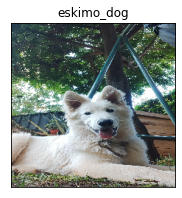

In [ ]:
# Plot images

plt.figure(figsize=(10,10))
for i, image in enumerate(my_dogs_converted_images):
  plt.subplot(1, 3, i+1) # 1 rows, 3 columns, index=i+1
  plt.xticks([])
  plt.yticks([])
  plt.title(my_dogs_pred_labels[i])
  plt.imshow(image)

# Improving the full model

Since our early experiment (using only 1000 images) hinted at our model overfitting (the results on the training set far outperformed the results on the validation set), one goal going forward would be to try and prevent it.

We will explore the following options:
1. Trying another model from TensorFlow Hub
2. Data augmentation
3. Fine-tuning

Resources:
* https://www.tensorflow.org/guide/keras/transfer_learning/
* https://tfhub.dev/tensorflow/efficientnet/b0/classification/1


## Trying another model

Let's try to use one of  Tensorflow's EfficientNets models: EfficientNet-B0. (https://tfhub.dev/tensorflow/efficientnet/b0/classification/1)

It requires TensorFlow 2.2+, so we need to upgrade our current tf package

In [35]:
# upgrade Tensorflow

!pip install --upgrade tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [36]:
# check tesnsorflow version
tf.__version__

'2.11.0'

In [37]:
EFFICIENT_NET_B0_URL = "https://tfhub.dev/tensorflow/efficientnet/b0/classification/1"

efficient_net_b0 = create_model(model_url=EFFICIENT_NET_B0_URL)
efficient_net_b0

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [39]:
b0_tensorboard_callback = create_tensorboard_callback()

b0_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

efficient_net_b0.fit(x=full_data,
                     epochs=100,
                     callbacks=[b0_tensorboard_callback, b0_early_stopping])

save_model(efficient_net_b0, "full-data-EfficientnetB0-Adam")

Epoch 1/100
320/320 [==============================] - 3350s 10s/step - loss: 1.3356 - accuracy: 0.6694
Epoch 2/100
320/320 [==============================] - 33s 102ms/step - loss: 0.4062 - accuracy: 0.8787
Epoch 3/100
320/320 [==============================] - 33s 102ms/step - loss: 0.2411 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1551 - accuracy: 0.9615
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1074 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0803 - accuracy: 0.9851
Epoch 7/100
320/320 [==============================] - 33s 101ms/step - loss: 0.0581 - accuracy: 0.9906
Epoch 8/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0452 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0383 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 32s 99ms

'drive/My Drive/Dog Vision/models/20230214-0648-full-data-EfficientnetB0-Adam.h5'